In [621]:
# Imports + cấu hình chung

from pathlib import Path
import json, os
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support

# >>> dùng đúng model bạn đã train
from model.mtl_efficientnet_b0 import MTLEfficientNetB0  # file bạn mới tạo

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Thư mục run cần đánh giá
RUN_DIR = Path("./runs") / "mtl_efficientnet_b0-20251110-203539"  # đổi cho đúng run của bạn
CKPT_DIR = RUN_DIR / "checkpoints"
CKPT_PATH = CKPT_DIR / "best.mtl"  # hoặc "last.mtl"

# Đọc class order đã dùng khi train
with open(RUN_DIR / "config.json","r",encoding="utf-8") as f:
    cfg = json.load(f)

CLASS_NAMES = [
    "Banh beo","Banh bot loc","Banh can","Banh canh","Banh chung","Banh cuon","Banh duc","Banh gio",
    "Banh khot","Banh mi","Banh pia","Banh tet","Banh trang nuong","Banh xeo","Bun bo Hue","Bun dau mam tom",
    "Bun mam","Bun rieu","Bun thit nuong","Ca kho to","Canh chua","Cao lau","Chao long","Com tam",
    "Goi cuon","Hu tieu","Mi quang","Nem chua","Pho","Xoi xeo","banh_da_lon","banh_tieu","banh_trung_thu"
]
NUM_CLASSES = len(CLASS_NAMES)

# Thư mục Test
ROOT = cfg.get("data_root", None)  # nếu bạn đã lưu vào config
if ROOT is None:
    # fallback (đổi cho đúng đường dẫn hiện tại của bạn)
    ROOT = "/media/mtl/DATA 6TB/AI DATASET/vietnamese-foods/Images"
ROOT = Path(ROOT)
TEST_DIR = ROOT / "Test"

# Transforms phải giống lúc train
IMG_SIZE = cfg.get("img_size", 224)
test_tfms = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),  # ImageNet
])
BATCH = 64
NUM_WORKERS = 8


In [622]:
# Helpers: mở checkpoint và chuẩn hóa state_dict
from pathlib import Path
import torch

def _extract_state_dict(obj):
    """
    Nhận bất kỳ object nào load từ torch.load và trả về state_dict thuần của model.
    Hỗ trợ các khóa thường gặp: model, state_dict, model_state_dict, net, weights.
    """
    if isinstance(obj, dict):
        for k in ["model", "state_dict", "model_state_dict", "net", "weights"]:
            if k in obj and isinstance(obj[k], dict):
                return obj[k], obj  # (state_dict, full_bundle)
    # Trường hợp file lưu trực tiếp model.state_dict
    if isinstance(obj, dict):
        # Heuristic: nếu đa số value là Tensor thì coi như state_dict
        tensor_like = sum(hasattr(v, "shape") for v in obj.values())
        if tensor_like >= max(1, len(obj)//2):
            return obj, {"__raw__": True}
    raise RuntimeError("Không tìm thấy state_dict trong checkpoint (các khóa phổ biến: model/state_dict/model_state_dict/net/weights).")

def _strip_module_prefix(sd):
    """Bóc 'module.' nếu đã từng dùng nn.DataParallel."""
    if not any(k.startswith("module.") for k in sd.keys()):
        return sd
    return {k.replace("module.", "", 1): v for k, v in sd.items()}

def _head_key_candidates(sd):
    """
    Tìm các khóa head phổ biến để suy ra số lớp trong checkpoint.
    Trả về (key_weight, out_features) nếu tìm được, else (None, None).
    """
    candidates = [
        "classifier.1.weight",     # kiểu Sequential([... , Linear])
        "classifier.weight",       # kiểu single Linear
        "fc.weight",               # ResNet-style
        "head.weight",             # timm-style
        "backbone.classifier.1.weight",
        "backbone.classifier.weight",
    ]
    for k in candidates:
        if k in sd:
            return k, sd[k].shape[0]
    # fallback: quét nhanh Linear cuối
    for k, v in sd.items():
        if k.endswith("weight") and v.ndim == 2 and v.shape[1] in (1280, 2048, 768, 512):
            return k, v.shape[0]
    return None, None


In [623]:
# Build model + load checkpoint an toàn 
# Thay MTLEfficientNetB0 bằng lớp model đúng của bạn nếu khác tên; và truyền num_classes hiện tại (33).
import torch.nn as nn
import torch

NUM_CLASSES = len(CLASS_NAMES)  # đảm bảo biến này đã có
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def build_model(num_classes=NUM_CLASSES):
    # TODO: dùng đúng class bạn train (vd MTLEfficientNetB0)
    model = MTLEfficientNetB0(num_classes=num_classes)
    return model

def load_checkpoint_safely(ckpt_path: str | Path, num_classes=NUM_CLASSES, device=DEVICE):
    ckpt_path = Path(ckpt_path)
    bundle = torch.load(str(ckpt_path), map_location=device)

    sd, full = _extract_state_dict(bundle)
    sd = _strip_module_prefix(sd)

    # Suy ra số lớp trong checkpoint (nếu tìm thấy head)
    head_key, ckpt_out = _head_key_candidates(sd)

    model = build_model(num_classes=num_classes).to(device)

    # TH1: số lớp trùng nhau -> load strict=True trước
    same_classes = (ckpt_out == num_classes) if ckpt_out is not None else True
    try:
        missing, unexpected = model.load_state_dict(sd, strict=same_classes)
        print(f"[OK] strict={same_classes} | missing={len(missing)} | unexpected={len(unexpected)}")
    except RuntimeError as e:
        print(f"[warn] strict={same_classes} failed: {e}")
        # TH2: khác head (vd ckpt_out != num_classes) -> bỏ qua head rồi load phần còn lại
        # Xác định key head trên model để bỏ qua tương ứng
        head_prefixes = [
            "classifier",              # EfficientNet phổ biến
            "backbone.classifier",     # nếu bạn bọc backbone
            "fc", "head"
        ]
        pruned = {}
        for k, v in sd.items():
            if any(k.startswith(p) for p in head_prefixes):
                continue
            pruned[k] = v
        missing, unexpected = model.load_state_dict(pruned, strict=False)
        print(f"[OK] strict=False (bỏ qua head) | missing={len(missing)} | unexpected={len(unexpected)}")
        # Khởi tạo lại head đúng số lớp
        # Nếu model của bạn có tên head khác, chỉnh lại đoạn dưới:
        if hasattr(model, "classifier") and isinstance(model.classifier, nn.Sequential):
            # tìm Linear cuối trong classifier để reset
            for m in reversed(model.classifier):
                if isinstance(m, nn.Linear):
                    in_f = m.in_features
                    m = nn.Linear(in_f, num_classes, bias=True)
                    break
            # Gán lại vào model.classifier[-1]
            seq = []
            for m in model.classifier:
                seq.append(m if not isinstance(m, nn.Linear) else nn.Linear(m.in_features, num_classes))
                break  # chỉ thay Linear cuối; tuỳ kiến trúc bạn có thể cần cẩn thận hơn
        elif hasattr(model, "classifier") and isinstance(model.classifier, nn.Linear):
            model.classifier = nn.Linear(model.classifier.in_features, num_classes)
        elif hasattr(model, "fc") and isinstance(model.fc, nn.Linear):
            model.fc = nn.Linear(model.fc.in_features, num_classes)
        # (Nếu model bọc khác thì thay cho đúng thuộc tính head.)

    model.eval()
    return model, sd, full, head_key, ckpt_out

# ======= GỌI =======
CKPT_PATH = "./runs/mtl_efficientnet_b0-20251110-203539/checkpoints/best.mtl"  # sửa cho đúng
model, sd, bundle, head_key, ckpt_out = load_checkpoint_safely(CKPT_PATH, num_classes=NUM_CLASSES, device=DEVICE)
print("head_key:", head_key, "| ckpt_out_classes:", ckpt_out)




[OK] strict=False | missing=0 | unexpected=0
head_key: backbone.classifier.1.weight | ckpt_out_classes: 512


In [624]:
def build_test_loader(test_dir: str = TEST_DIR, img_size: int = IMG_SIZE, batch_size: int = BATCH):
    """Tạo DataLoader test. Trả về (loader, dataset)."""
    tfm = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        # nếu lúc train có Normalize(...) thì thêm vào đúng mean/std tại đây
    ])
    ds = datasets.ImageFolder(test_dir, transform=tfm)
    loader = DataLoader(ds, batch_size=batch_size, shuffle=False, num_workers= NUM_WORKERS, pin_memory=True)
    return loader, ds

In [625]:
# Sanity check nhanh (tránh “đoán 1 lớp”)
import torch.nn.functional as F

# Lấy 1 batch từ test_loader của bạn
test_loader, _ = build_test_loader(TEST_DIR, IMG_SIZE, BATCH)
xb, yb = next(iter(test_loader))
xb = xb.to(DEVICE)
with torch.no_grad():
    logits = model(xb)
    probs = F.softmax(logits, dim=1)
print("logits shape:", logits.shape, "probs min/max:", probs.min().item(), probs.max().item())
# Nếu logits có shape [B, 33] và probs không toàn 1 ở 1 cột là OK.


logits shape: torch.Size([64, 33]) probs min/max: 1.037919082591543e-05 0.9968791007995605


In [626]:
# Thu thập logits + nhãn thật
import numpy as np
import torch
import torch.nn.functional as F
from pathlib import Path

IMAGES_DIR = Path("./images"); IMAGES_DIR.mkdir(exist_ok=True)

@torch.no_grad()
def collect_logits(model, loader, device=DEVICE, max_batches=None):
    model.eval()
    y_true, y_prob, y_pred, paths = [], [], [], []
    seen = 0
    for bi, (xb, yb) in enumerate(loader):
        xb = xb.to(device, non_blocking=True)
        logits = model(xb)
        prob = F.softmax(logits, dim=1).cpu().numpy()
        pred = prob.argmax(axis=1)

        y_true.append(yb.numpy())
        y_prob.append(prob)
        y_pred.append(pred)

        # Nếu loader trả về (img, label, path)
        if len(yb.shape) == 0 and len(xb.shape) >= 4 and len(prob) == len(pred):
            pass
        if isinstance(loader.dataset, tuple) and len(loader.dataset) > 2:
            paths.extend(loader.dataset[2][seen:seen+len(prob)])
        elif hasattr(loader.dataset, "samples"):
            # torchvision ImageFolder
            start = seen
            paths.extend([p for p, _ in loader.dataset.samples[start:start+len(prob)]])
        else:
            paths.extend([""] * len(prob))

        seen += len(prob)
        if max_batches and (bi+1) >= max_batches: break

    y_true = np.concatenate(y_true)
    y_prob = np.concatenate(y_prob)
    y_pred = np.concatenate(y_pred)
    return y_true, y_prob, y_pred, np.array(paths)


In [627]:
# Accuracy, Precision/Recall/F1
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, classification_report

def compute_scores(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec, rec, f1, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0
    )
    return acc, prec, rec, f1

def per_class_report(y_true, y_pred, class_names=CLASS_NAMES):
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))


In [628]:
# Vẽ Confusion Matrix (chuẩn row-norm)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, class_names=CLASS_NAMES, title="Confusion Matrix (row-norm)", out_png=None):
    cm = confusion_matrix(y_true, y_pred, labels=np.arange(len(class_names)))
    cm_row = cm / cm.sum(axis=1, keepdims=True)
    cm_row = np.nan_to_num(cm_row)

    plt.figure(figsize=(10, 10), dpi=180)
    ax = sns.heatmap(cm_row, cmap="Blues", square=True, cbar=True,
                     vmin=0, vmax=1, xticklabels=class_names, yticklabels=class_names)
    ax.set_xlabel("Pred"); ax.set_ylabel("True"); ax.set_title(title)
    plt.xticks(rotation=90); plt.yticks(rotation=0)
    plt.tight_layout()
    if out_png:
        plt.savefig(out_png, dpi=300, bbox_inches="tight")
        print("✓ Saved:", out_png)
    plt.show()
    return cm, cm_row


In [629]:
# ROC OVR + Macro AUC (legend top-k)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

def plot_roc_ovr(y_true, y_prob, class_names=CLASS_NAMES, run_label="model", topk_curves=5, out_dir=IMAGES_DIR):
    y_true_bin = label_binarize(y_true, classes=np.arange(len(class_names)))
    fprs, tprs, aucs = [], [], []
    for c in range(len(class_names)):
        fpr, tpr, _ = roc_curve(y_true_bin[:, c], y_prob[:, c])
        fprs.append(fpr); tprs.append(tpr)
        aucs.append(auc(fpr, tpr))
    macro_auc = float(np.mean(aucs))

    # chọn top-k theo AUC
    idx = np.argsort(aucs)[-topk_curves:][::-1]

    plt.figure(figsize=(7, 6.5), dpi=180)
    for i in idx:
        plt.plot(fprs[i], tprs[i], lw=2, label=f"{class_names[i]} (AUC = {aucs[i]:.3f})")
    plt.plot([0,1],[0,1],'k--', lw=1)
    plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
    plt.title(f"ROC Curves – {run_label}\nMacro AUC = {macro_auc:.3f}")
    plt.legend(loc="lower right", fontsize=9, frameon=True)
    out = Path(out_dir)/f"{run_label}_roc.png"
    plt.tight_layout(); plt.savefig(out, dpi=300, bbox_inches="tight")
    print("✓ Saved:", out)
    plt.show()
    return macro_auc, np.array(aucs)


In [630]:
# Top-20 cặp dễ nhầm
def top_confused_pairs(cm_row, class_names=CLASS_NAMES, topn=20, min_count=None, cm_abs=None):
    # cm_row là normalized theo hàng. Nếu có cm_abs, có thể lọc theo min_count (số mẫu thật)
    pairs = []
    for i in range(len(class_names)):
        for j in range(len(class_names)):
            if i==j: continue
            if min_count and cm_abs is not None and cm_abs[i].sum() < min_count:
                continue
            pairs.append((class_names[i], class_names[j], float(cm_row[i,j])))
    pairs.sort(key=lambda x: x[2], reverse=True)
    return pairs[:topn]

def show_top_confused(cm, cm_row, class_names=CLASS_NAMES, topn=20):
    pairs = top_confused_pairs(cm_row, class_names, topn=topn, cm_abs=cm)
    print("Top dễ nhầm:")
    for a,b,score in pairs:
        print(f"{a:>18}  →  {b:<18} : {score:.3f}")


In [631]:
# Phân tích lỗi: hiển thị vài ảnh đoán sai
from PIL import Image
import math
import os

def show_errors_grid(paths, y_true, y_pred, y_prob, class_names=CLASS_NAMES, n=16, cols=4, img_size=128):
    wrong = np.where(y_true != y_pred)[0]
    if len(wrong)==0:
        print("Không có lỗi.")
        return
    picks = wrong[:n]
    rows = math.ceil(len(picks)/cols)
    plt.figure(figsize=(cols*3.2, rows*3.2), dpi=150)
    for k,idx in enumerate(picks):
        plt.subplot(rows, cols, k+1)
        p = paths[idx]
        try:
            im = Image.open(p).convert("RGB").resize((img_size,img_size))
            plt.imshow(im)
        except Exception:
            plt.imshow(np.zeros((img_size,img_size,3), dtype=np.uint8))
        t = class_names[y_true[idx]]
        pd = class_names[y_pred[idx]]
        conf = y_prob[idx, y_pred[idx]]
        plt.title(f"T:{t}\nP:{pd} ({conf:.2f})", fontsize=9)
        plt.axis("off")
    plt.tight_layout(); plt.show()


In [632]:
# Tốc độ & tài nguyên
import time
from copy import deepcopy

def benchmark_speed(model, input_size=(1,3,224,224), repeat=50, warmup=10, device=DEVICE):
    model = deepcopy(model).to(device).eval()
    x = torch.randn(*input_size, device=device)
    # warmup
    with torch.no_grad():
        for _ in range(warmup): model(x)
        torch.cuda.synchronize() if device.type=="cuda" else None
        t0 = time.time()
        for _ in range(repeat): model(x)
        torch.cuda.synchronize() if device.type=="cuda" else None
        dt = time.time()-t0
    fps = repeat/dt
    params = sum(p.numel() for p in model.parameters())
    # ước lượng size weights
    bytes_per_param = 4  # float32
    size_mb = params*bytes_per_param/1024/1024
    return dict(fps=fps, params=params, size_mb=size_mb, latency_ms=1000/fps)


In [633]:
def evaluate_checkpoint(ckpt_path, run_name="model", topk_curves=5, show_errors=16):
    print(f"=== Đánh giá: {run_name} ===")
    model, _, _, _, _ = load_checkpoint_safely(ckpt_path, num_classes=NUM_CLASSES, device=DEVICE)

    test_loader, _ = build_test_loader(TEST_DIR, IMG_SIZE, BATCH)
    y_true, y_prob, y_pred, paths = collect_logits(model, test_loader, DEVICE)
    acc, pre, rec, f1 = compute_scores(y_true, y_pred)
    print(f"[acc={acc:.4f}]  [macro P/R/F1 = {pre:.4f}/{rec:.4f}/{f1:.4f}]")

    # CM
    out_cm = IMAGES_DIR / f"{run_name}_cm.png"
    cm, cm_row = plot_confusion_matrix(y_true, y_pred, CLASS_NAMES,
                                       title=f"Confusion Matrix (row-norm) – {run_name}",
                                       out_png=out_cm)
    show_top_confused(cm, cm_row, CLASS_NAMES, topn=20)

    # ROC
    macro_auc, aucs = plot_roc_ovr(y_true, y_prob, CLASS_NAMES, run_label=run_name, topk_curves=topk_curves)

    # Error grid
    show_errors_grid(paths, y_true, y_pred, y_prob, CLASS_NAMES, n=show_errors, cols=4, img_size=160)

    # Speed / resource
    speed = benchmark_speed(model, input_size=(1,3,IMG_SIZE,IMG_SIZE), repeat=60, warmup=15, device=DEVICE)
    print(f"[Speed] ~{speed['fps']:.1f} FPS | latency {speed['latency_ms']:.1f} ms | "
          f"params {speed['params']/1e6:.2f}M | ~{speed['size_mb']:.1f} MB")

    return dict(acc=acc, pre=pre, rec=rec, f1=f1, macro_auc=macro_auc, speed=speed)


=== Đánh giá: mtl_efficientnet_b0-20251110-203539 ===
[OK] strict=False | missing=0 | unexpected=0


[acc=0.8630]  [macro P/R/F1 = 0.8654/0.8630/0.8634]
✓ Saved: images/mtl_efficientnet_b0-20251110-203539_cm.png


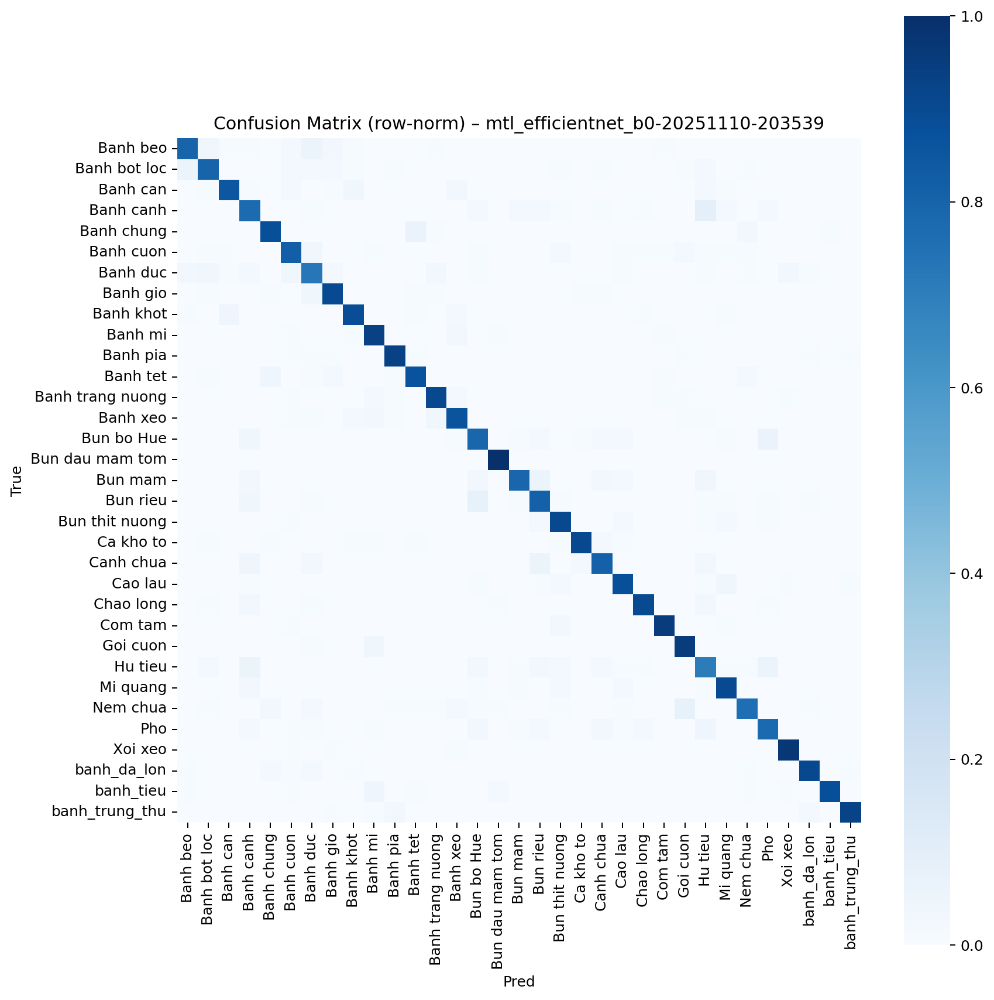

Top dễ nhầm:
         Banh canh  →  Hu tieu            : 0.090
          Bun rieu  →  Bun bo Hue         : 0.080
          Nem chua  →  Goi cuon           : 0.080
        Banh chung  →  Banh tet           : 0.070
        Bun bo Hue  →  Pho                : 0.070
          Banh beo  →  Banh duc           : 0.060
      Banh bot loc  →  Banh beo           : 0.060
           Bun mam  →  Bun rieu           : 0.060
         Canh chua  →  Bun rieu           : 0.060
           Hu tieu  →  Banh canh          : 0.060
           Hu tieu  →  Pho                : 0.060
         Banh khot  →  Banh can           : 0.050
          Banh tet  →  Banh chung         : 0.050
         Canh chua  →  Banh canh          : 0.050
               Pho  →  Hu tieu            : 0.050
         banh_tieu  →  Banh mi            : 0.050
          Banh beo  →  Banh bot loc       : 0.040
          Banh can  →  Banh khot          : 0.040
         Banh cuon  →  Banh duc           : 0.040
          Banh duc  →  Banh bot loc  

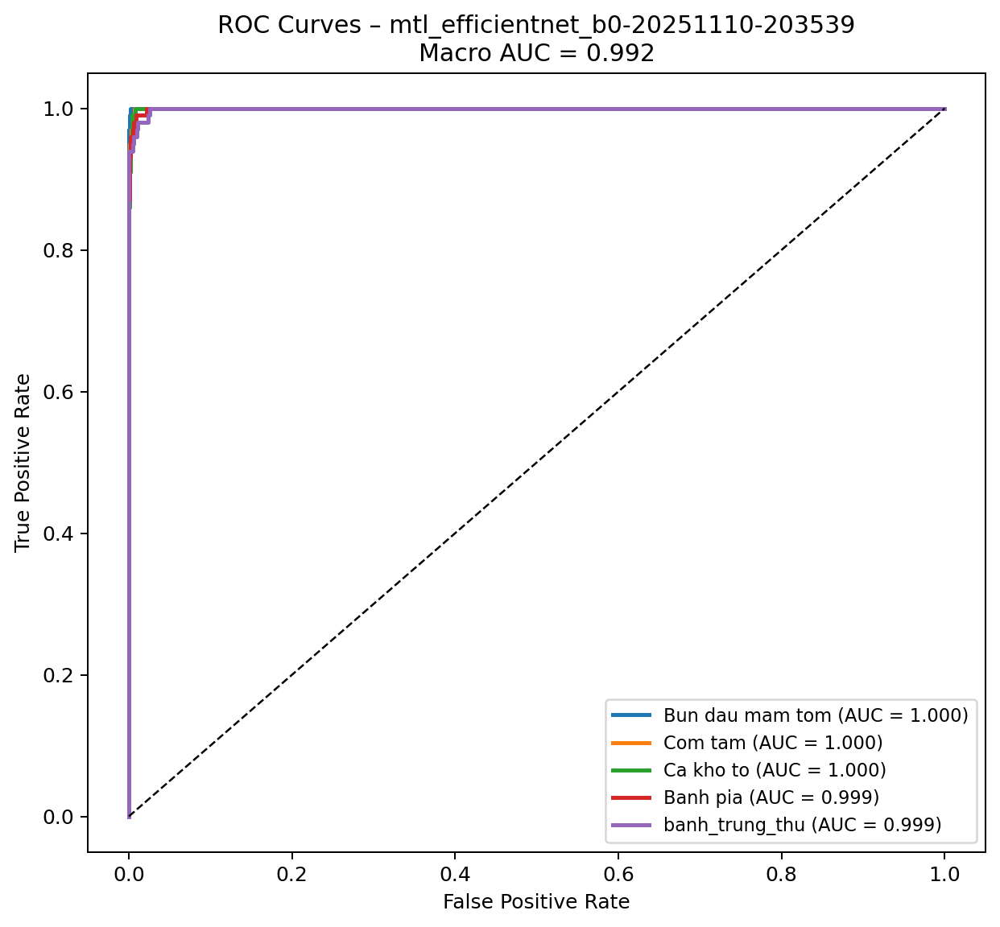

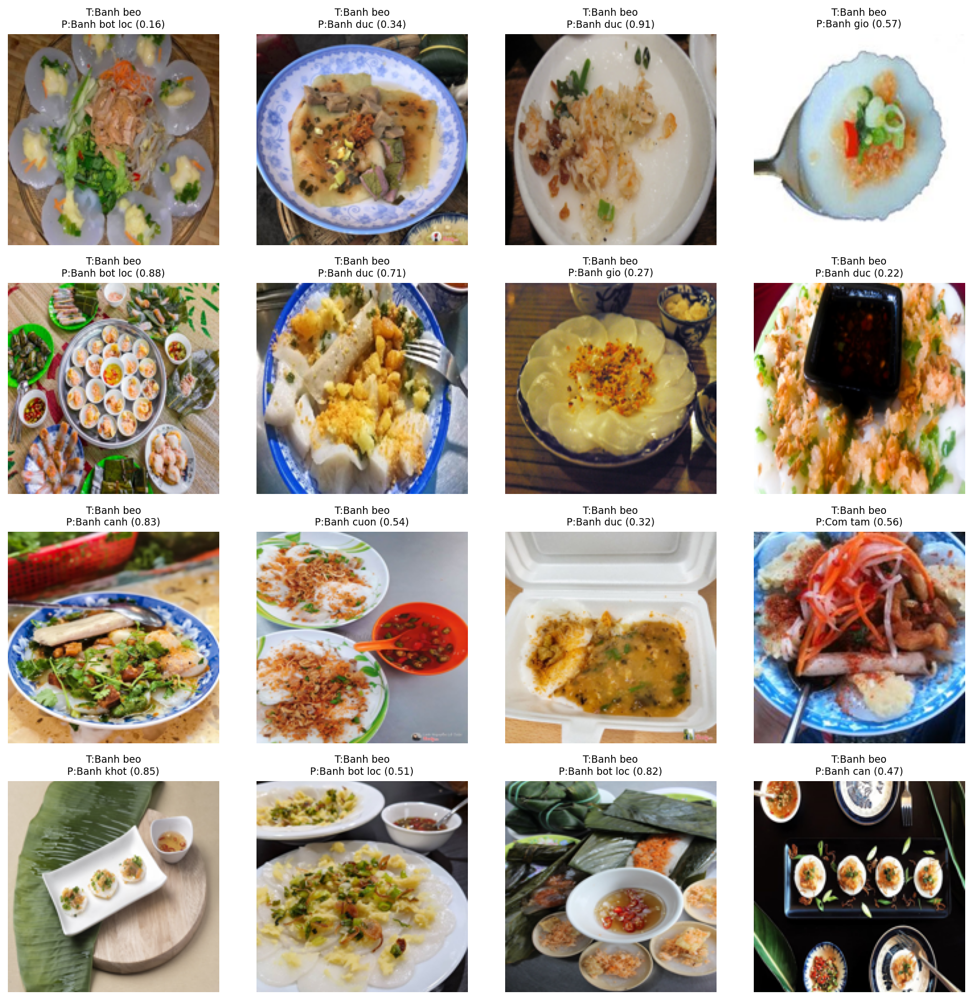

[Speed] ~152.5 FPS | latency 6.6 ms | params 4.68M | ~17.9 MB


{'acc': 0.8629887844801455,
 'pre': 0.8654430131395063,
 'rec': 0.8630088766452403,
 'f1': 0.8633848393638629,
 'macro_auc': 0.9920623316629881,
 'speed': {'fps': 152.47985380832702,
  'params': 4681373,
  'size_mb': 17.858020782470703,
  'latency_ms': 6.5582434336344395}}

In [634]:
# Gọi chạy
# Sửa đường dẫn đúng checkpoint bạn muốn đánh giá
ckpt = "./runs/mtl_efficientnet_b0-20251110-203539/checkpoints/best.mtl"
result = evaluate_checkpoint(ckpt_path=ckpt, run_name="mtl_efficientnet_b0-20251110-203539", topk_curves=5, show_errors=16)
result



[warn] strict=True fail -> thử strict=False: Error(s) in loading state_dict for MTLEfficientNetB0:
	Missing key(s) in state_dict: "backbone.features.0.0.weight", "backbone.features.0.1.weight", "backbone.features.0.1.bias", "backbone.features.0.1.running_mean", "backbone.features.0.1.running_var", "backbone.features.1.0.block.0.0.weight", "backbone.features.1.0.block.0.1.weight", "backbone.features.1.0.block.0.1.bias", "backbone.features.1.0.block.0.1.running_mean", "backbone.features.1.0.block.0.1.running_var", "backbone.features.1.0.block.1.fc1.weight", "backbone.features.1.0.block.1.fc1.bias", "backbone.features.1.0.block.1.fc2.weight", "backbone.features.1.0.block.1.fc2.bias", "backbone.features.1.0.block.2.0.weight", "backbone.features.1.0.block.2.1.weight", "backbone.features.1.0.block.2.1.bias", "backbone.features.1.0.block.2.1.running_mean", "backbone.features.1.0.block.2.1.running_var", "backbone.features.2.0.block.0.0.weight", "backbone.features.2.0.block.0.1.weight", "backbo

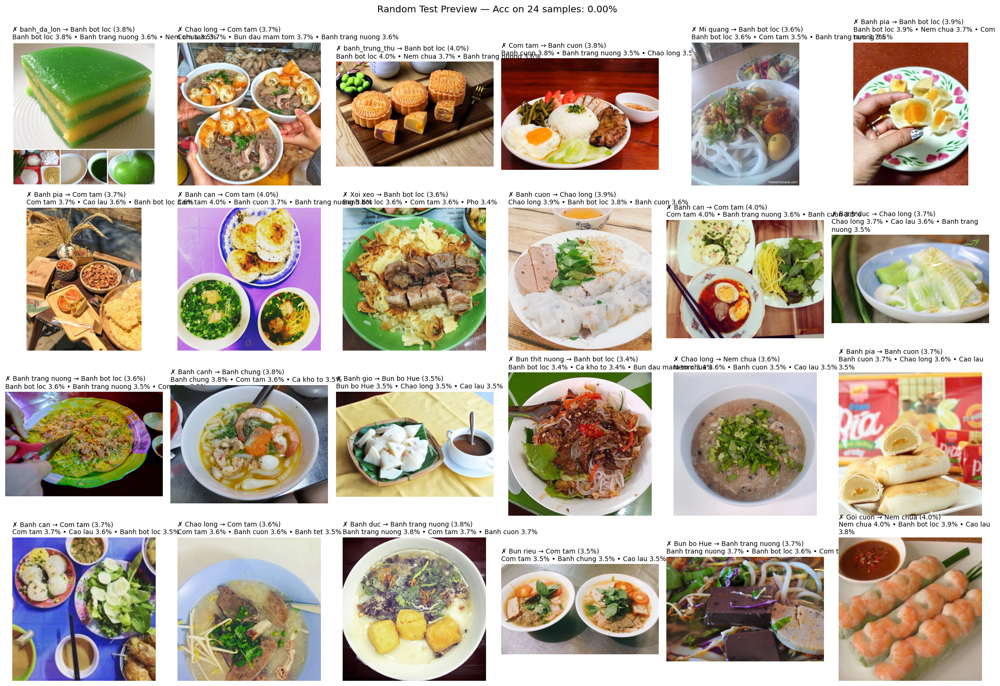

Done. Acc (random 24 ảnh): 0.00%


In [635]:
# === CELL: Random test preview & check correctness ===
import os, random, math, glob, io
from pathlib import Path
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

# ====== CONFIG ↓ (đổi cho đúng path của bạn) ======
#TEST_DIR   = Path("/media/mtl/DATA 6TB/PROJECT AI/DL-DuDoan33MonAnVietNam/Images/Test")  # <== thư mục Test theo class-folder
CKPT_PATH  = Path("./runs/mtl_efficientnet_b0-20251110-203539/checkpoints/best.mtl")                                  # <== checkpoint sạch (có state_dict)
N_SAMPLES  = 24   # số ảnh random để show
TOPK       = 3    # show top-k
SAVE_FIG   = "images/random_test_preview.png"  # None nếu ko muốn lưu
IMG_SIZE   = 224

# Nếu notebook đã có sẵn DEVICE / CLASS_NAMES / build_model / load_checkpoint_strict thì dùng lại
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ====== Normalization (lấy từ ckpt nếu có) ======
mean_std_default = {"mean": (0.485,0.456,0.406), "std": (0.229,0.224,0.225)}
ckpt = torch.load(str(CKPT_PATH), map_location="cpu")
state = ckpt.get("state_dict", ckpt)  # fallback nếu .mtl lưu thẳng state_dict



'''
if "class_names" in ckpt:
    CLASS_NAMES = ckpt["class_names"]
else:
    # fallback: lấy list class từ thư mục Test nếu chưa có
    CLASS_NAMES = sorted([d.name for d in Path(TEST_DIR).iterdir() if d.is_dir()])
NUM_CLASSES = len(CLASS_NAMES)
'''




CLASS_NAMES = [
    "Banh beo","Banh bot loc","Banh can","Banh canh","Banh chung","Banh cuon","Banh duc","Banh gio",
    "Banh khot","Banh mi","Banh pia","Banh tet","Banh trang nuong","Banh xeo","Bun bo Hue","Bun dau mam tom",
    "Bun mam","Bun rieu","Bun thit nuong","Ca kho to","Canh chua","Cao lau","Chao long","Com tam",
    "Goi cuon","Hu tieu","Mi quang","Nem chua","Pho","Xoi xeo","banh_da_lon","banh_tieu","banh_trung_thu"
]
NUM_CLASSES = len(CLASS_NAMES)



norm_cfg = ckpt.get("normalize", mean_std_default)
_mean, _std = norm_cfg["mean"], norm_cfg["std"]

tfm = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(_mean, _std),
])

# ====== Build model & load ckpt ======
try:
    # bạn đã có build_model(NUM_CLASSES) trong notebook -> ưu tiên dùng
    model = build_model(NUM_CLASSES).to(device).eval()
except NameError:
    # fallback: EfficientNet-B0 tối giản (nếu bạn không có build_model)
    import torchvision.models as tvm
    m = tvm.efficientnet_b0(weights=None)
    in_features = m.classifier[-1].in_features
    m.classifier[-1] = torch.nn.Linear(in_features, NUM_CLASSES)
    model = m.to(device).eval()

# cố gắng load strict, nếu fail thì nới lỏng nhưng sẽ cảnh báo
missing, unexpected = [], []
try:
    miss, unexp = model.load_state_dict(state, strict=True)
    missing, unexpected = list(miss), list(unexp)
except Exception as e:
    print("[warn] strict=True fail -> thử strict=False:", e)
    miss, unexp = model.load_state_dict(state, strict=False)
    missing, unexpected = list(miss), list(unexp)

print(f"[ckpt] missing={len(missing)} | unexpected={len(unexpected)}")
if len(missing) > 0:
    # Nếu backbone/classifier bị thiếu là dấu hiệu nạp sai -> cảnh báo to
    bad = [k for k in missing if ("features" in k or "classifier" in k or "backbone" in k)]
    if bad:
        print("[⚠] Backbone/Classifier không nạp đủ -> kết quả có thể sai. Hãy export lại ckpt sạch như mình hướng dẫn ở trên.")

# ====== Helper ======
IMG_EXTS = {".jpg",".jpeg",".png",".webp",".bmp",".tif",".tiff"}
def list_images(root: Path):
    files = []
    for c in CLASS_NAMES:
        d = root / c
        if not d.is_dir(): 
            continue
        for p in d.rglob("*"):
            if p.suffix.lower() in IMG_EXTS:
                files.append(p)
    return files

@torch.no_grad()
def predict_image(pil_img: Image.Image):
    x = tfm(pil_img).unsqueeze(0).to(device)
    logits = model(x)
    prob = F.softmax(logits, dim=1).squeeze(0).cpu().numpy()
    top_idx = prob.argsort()[-TOPK:][::-1]
    return top_idx, prob

def human_name_from_path(p: Path):
    # ground truth = tên thư mục cha (chuẩn ImageFolder)
    return p.parent.name

# ====== Get random samples ======
all_imgs = list_images(TEST_DIR)
if len(all_imgs) == 0:
    raise SystemExit(f"Không tìm thấy ảnh trong {TEST_DIR}")

samples = random.sample(all_imgs, k=min(N_SAMPLES, len(all_imgs)))

# ====== Predict & draw grid ======
cols = 6
rows = math.ceil(len(samples)/cols)
plt.figure(figsize=(cols*3.2, rows*3.3), dpi=110)
correct = 0

for i, path in enumerate(samples, 1):
    try:
        img = Image.open(path).convert("RGB")
    except:
        continue
    top_idx, prob = predict_image(img)
    gt = human_name_from_path(path)
    pred = CLASS_NAMES[top_idx[0]]
    ok = (gt == pred)
    if ok: correct += 1

    plt.subplot(rows, cols, i)
    plt.imshow(img)
    plt.axis("off")

    # tiêu đề: ✓/✗ + tên
    mark = "✓" if ok else "✗"
    title = f"{mark} {gt} → {pred} ({prob[top_idx[0]]*100:.1f}%)"
    # dòng top-k
    topk_txt = " • ".join([f"{CLASS_NAMES[j]} {prob[j]*100:.1f}%" for j in top_idx])
    plt.title(title + "\n" + topk_txt, fontsize=9, loc="left", wrap=True)

acc = correct / len(samples)
plt.suptitle(f"Random Test Preview — Acc on {len(samples)} samples: {acc*100:.2f}%", fontsize=13, y=0.995)
plt.tight_layout()

if SAVE_FIG:
    Path(SAVE_FIG).parent.mkdir(parents=True, exist_ok=True)
    plt.savefig(SAVE_FIG, dpi=300, bbox_inches="tight")
plt.show()
print(f"Done. Acc (random {len(samples)} ảnh): {acc*100:.2f}%")


In [643]:
# ==== AUTO-FIX LOADER FOR EFFICIENTNET-B0 (torchvision) ====
import torch, torch.nn as nn
import torchvision.models as tvm
from torchvision import transforms as T
from pathlib import Path
from PIL import Image
import numpy as np, random, matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CKPT_PATH  = Path("./runs/mtl_efficientnet_b0-20251110-203539/checkpoints/best.mtl")   
IMG_SIZE = 224

def build_efficientnet_b0(num_classes:int):
    m = tvm.efficientnet_b0(weights=None)
    in_features = m.classifier[-1].in_features
    m.classifier[-1] = nn.Linear(in_features, num_classes)
    return m

def _extract_state_dict(ckpt):
    # Ưu tiên các key thường gặp
    for k in ("state_dict", "model", "net", "module"):
        if isinstance(ckpt, dict) and k in ckpt and isinstance(ckpt[k], dict):
            sd = ckpt[k]
            break
    else:
        sd = ckpt if isinstance(ckpt, dict) else ckpt

    # Bóc các prefix wrapper phổ biến
    def strip_prefix(sd, prefix):
        return { (k[len(prefix):] if k.startswith(prefix) else k): v for k,v in sd.items() }

    for p in ("module.", "backbone.", "model.", "net."):
        sd = strip_prefix(sd, p)

    # Map một số tên head khác chuẩn về đúng tên của torchvision
    # torchvision: 'classifier.1.weight' / 'classifier.1.bias'
    if "classifier.weight" in sd and "classifier.1.weight" not in sd:
        sd["classifier.1.weight"] = sd.pop("classifier.weight")
    if "classifier.bias" in sd and "classifier.1.bias" not in sd:
        sd["classifier.1.bias"] = sd.pop("classifier.bias")

    return sd

def load_backbone_strict_head_flexible(model, ckpt):
    sd = _extract_state_dict(ckpt)
    model_sd = model.state_dict()

    # remap backbone khớp shape, bỏ head nếu shape lệch
    loadable = {}
    skipped = []
    for k, v in sd.items():
        if k.startswith("classifier"):   # head để flexible
            skipped.append(k); continue
        if k in model_sd and model_sd[k].shape == v.shape:
            loadable[k] = v

    missing, unexpected = model.load_state_dict(loadable, strict=False)
    # missing chủ yếu là classifier.* và các key không có trong loadable → ok
    print(f"[info] loaded backbone: {len(loadable)} params,"
          f" missing={len(missing)}, unexpected={len(unexpected)} (ignored head keys: {len(skipped)})")

    # Nếu classifier.* có trong sd và shape trùng thì load nốt; nếu không thì giữ head mới theo NUM_CLASSES
    if "classifier.1.weight" in sd and sd["classifier.1.weight"].shape == model_sd["classifier.1.weight"].shape:
        model.classifier[1].weight.data.copy_(sd["classifier.1.weight"])
        model.classifier[1].bias.data.copy_(sd["classifier.1.bias"])
        print("[info] classifier loaded (same num_classes).")
    else:
        print("[info] classifier re-init (num_classes khác ckpt).")

    return model

# ==== Load ckpt + class_names + normalize (nếu có) ====
ckpt = torch.load(CKPT_PATH, map_location=device)

# class_names
if isinstance(ckpt, dict) and "class_names" in ckpt:
    CLASS_NAMES = list(ckpt["class_names"])
else:
    # ⛑️ fallback – NHƯNG NÊN LẤY TỪ CKPT CHO CHẮC
    CLASS_NAMES = [
        "Banh beo","Banh bot loc","Banh can","Banh canh","Banh chung","Banh cuon","Banh duc","Banh gio",
        "Banh khot","Banh mi","Banh pia","Banh tet","Banh trang nuong","Banh xeo","Bun bo Hue","Bun dau mam tom",
        "Bun mam","Bun rieu","Bun thit nuong","Ca kho to","Canh chua","Cao lau","Chao long","Com tam","Goi cuon",
        "Hu tieu","Mi quang","Nem chua","Pho","Xoi xeo","banh_da_lon","banh_tieu","banh_trung_thu"
    ]
NUM_CLASSES = len(CLASS_NAMES)

# normalize
mean, std = (0.485,0.456,0.406), (0.229,0.224,0.225)
if isinstance(ckpt, dict) and "normalize" in ckpt:
    try:
        mean = tuple(ckpt["normalize"]["mean"])
        std  = tuple(ckpt["normalize"]["std"])
    except Exception:
        pass

TEST_TFM = T.Compose([
    T.Resize(256),
    T.CenterCrop(IMG_SIZE),
    T.ToTensor(),
    T.Normalize(mean, std),
])

# ==== Build & load ====
model = build_efficientnet_b0(NUM_CLASSES).to(device).eval()
model = load_backbone_strict_head_flexible(model, ckpt)
print("✅ Ready:", len(CLASS_NAMES), "classes")

# ==== Predict util ====
@torch.no_grad()
def predict_paths(paths, topk=3):
    ims = [TEST_TFM(Image.open(p).convert("RGB")) for p in paths]
    batch = torch.stack(ims).to(device)
    prob = torch.softmax(model(batch), dim=1)
    scores, idx = prob.topk(topk, dim=1)
    return scores.cpu().numpy(), idx.cpu().numpy()

# ==== Random test preview (24 ảnh) ====
TEST_DIR = Path("Images/Test")  # 👉 đổi đúng path test của bạn
all_imgs = []
for c in CLASS_NAMES:
    cd = TEST_DIR / c
    all_imgs += [*cd.glob("*.jpg"), *cd.glob("*.jpeg"), *cd.glob("*.png")]

random.seed(42)
sample = random.sample(all_imgs, k=min(24, len(all_imgs)))
scores, idx = predict_paths(sample, topk=3)

cols = 6
rows = int(np.ceil(len(sample)/cols))
plt.figure(figsize=(cols*3.2, rows*3.2))
ok = 0
for i,p in enumerate(sample):
    ax = plt.subplot(rows, cols, i+1); ax.axis("off")
    ax.imshow(Image.open(p).convert("RGB"))
    gt = p.parent.name
    pred1 = CLASS_NAMES[idx[i,0]]
    ok += int(pred1 == gt)
    ax.set_title(f"GT: {gt}\nPred: {pred1} – {scores[i,0]*100:.1f}%", fontsize=9,
                 color=("tab:green" if pred1==gt else "tab:red"))
plt.suptitle(f"Random Test Preview — Acc {ok/len(sample)*100:.2f}% on {len(sample)} imgs", y=0.99)
plt.tight_layout(); plt.show()


[info] loaded backbone: 358 params, missing=2, unexpected=0 (ignored head keys: 9)
[info] classifier re-init (num_classes khác ckpt).
✅ Ready: 33 classes


RuntimeError: stack expects a non-empty TensorList